# **COVID-19 Data Analysis**


---
# **📌 Step 1: Title & Introduction**

---

### **COVID-19 Data Analysis using Python** 📊
#### **Author:** Muhammad Danish Azeem  
#### **Email:** danishazeem@gmail.com
#### **Dataset Source:** COVID-19 Dataset https://www.kaggle.com/datasets/meirnizri/covid19-dataset  

## **📌 Project Overview**  
This project analyzes the **COVID-19 dataset** to uncover insights into global trends, case spikes, mortality rates, and vaccination progress.  
We perform **data preprocessing, exploratory analysis (EDA), and visualization** to understand key patterns.  


# **📌 Step 2: Importing Necessary Libraries**  


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import zscore
import math
from scipy.stats.mstats import winsorize


# **📌 Step 3: Loading & Understanding the Dataset**  

In [ ]:

from google.colab import drive
drive.mount('/content/drive')
df = pd.read_csv('/content/drive/My Drive/Data Sets/covid-data.csv')

Mounted at /content/drive


**Note**: Some the output of notebook does not present the complete output, therefore we can increase the limit of columns view and row view by using these commands:

In [ ]:
pd.set_option('display.max_columns', None) # this is to display all the columns in the dataframe
pd.set_option('display.max_rows', None) # this is to display all the rows in the dataframe

In [ ]:
# hide all warnings runtime
import warnings
warnings.filterwarnings('ignore')


# **📌 Step 4: Data Summary & Initial Cleaning**  

In [ ]:
# Display the first few rows
df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302512 entries, 0 to 302511
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    302512 non-null  object 
 1   continent                                   288160 non-null  object 
 2   location                                    302512 non-null  object 
 3   date                                        302512 non-null  object 
 4   total_cases                                 266771 non-null  float64
 5   new_cases                                   294064 non-null  float64
 6   new_cases_smoothed                          292800 non-null  float64
 7   total_deaths                                246214 non-null  float64
 8   new_deaths                                  294139 non-null  float64
 9   new_deaths_smoothed                         292909 non-null  float64
 

# **Observations**
---
1. There are 302512 rows and 67 columns in the dataset
2. The columns are of different data types
3. The columns in the datasets are:
   - 'iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',
       'new_vaccinations_smoothed_per_million',
       'new_people_vaccinated_smoothed',
       'new_people_vaccinated_smoothed_per_hundred', 'stringency_index',
       'population_density', 'median_age', 'aged_65_older', 'aged_70_older',
       'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate',
       'diabetes_prevalence', 'female_smokers', 'male_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index', 'population',
       'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative',
       'excess_mortality', 'excess_mortality_cumulative_per_million'
     
4. There are some missing values in the dataset which we will read in details and deal later on in the notebook.

---

In [ ]:
df.sample(50)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
140768,KWT,Asia,Kuwait,2022-08-09,655981.0,127.0,137.714,2562.0,0.0,0.000,153665.617,29.750,32.260,600.157,0.000,0.000,0.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8188392.0,3441269.0,3331844.0,1415279.0,NaN,1341.0,191.82,80.61,78.05,33.15,314.0,162.0,0.004,11.11,232.128,33.7,2.345,1.114,65530.537,NaN,132.235,15.84,2.7,37.0,NaN,2.000,75.49,0.806,4268886.0,NaN,NaN,NaN,NaN
51934,CHL,South America,Chile,2021-05-21,1308311.0,7682.0,5958.571,28169.0,172.0,92.714,66737.840,391.864,303.951,1436.920,8.774,4.729,1.07,2991.0,152.573,NaN,NaN,1161.0,59.223,3534.0,180.272,14205256.0,68158.0,728.729,3.497,56718.0,2.910,0.1068,9.4,tests performed,17369736.0,9637543.0,7732193.0,NaN,9853.0,103842.0,88.60,49.16,39.44,NaN,5297.0,75004.0,0.383,80.09,24.282,35.4,11.087,6.938,22767.037,1.3,127.993,8.46,34.2,41.5,NaN,2.110,80.18,0.851,19603736.0,NaN,NaN,NaN,NaN
111355,GNB,Africa,Guinea-Bissau,2020-07-30,1981.0,0.0,3.857,26.0,0.0,0.000,940.833,0.000,1.832,12.348,0.000,0.000,0.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.191,19.4,3.002,1.565,1548.675,67.1,382.474,2.42,NaN,NaN,6.403,NaN,58.32,0.480,2105580.0,NaN,NaN,NaN,NaN
136308,KEN,Africa,Kenya,2020-03-20,7.0,0.0,1.000,NaN,0.0,0.000,0.130,0.000,0.019,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.0,0.000,0.0390,25.7,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68.52,87.324,20.0,2.686,1.528,2993.028,36.8,218.637,2.92,1.2,20.4,24.651,1.400,66.70,0.601,54027484.0,NaN,NaN,NaN,NaN
88317,FLK,South America,Falkland Islands,2022-12-29,1923.0,0.0,0.000,NaN,0.0,0.000,505919.495,0.000,0.000,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.44,NaN,3801.0,NaN,NaN,NaN,NaN
235654,STP,Africa,Sao Tome and Principe,2023-02-08,6280.0,0.0,0.000,77.0,0.0,0.000,27617.385,0.000,0.000,338.621,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,352.0,NaN,NaN,NaN,NaN,1548.0,130.0,0.057,NaN,212.841,18.7,2.886,2.162,3052.714,32.3,270.113,2.42,NaN,NaN,41.340,2.900,70.39,0.625,227393.0,NaN,NaN,NaN,NaN
173254,MCO,Europe,Monaco,2020-12-22,742.0,14.0,10.000,3.0,0.0,0.000,20333.781,383.656,274.040,82.212,0.000,0.000,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.37,19347.500,NaN,NaN,NaN,NaN,NaN,NaN,5.46,NaN,NaN,NaN,13.800,86.75,

- `df.sample(50)` gives us whole picture or idea about data.

In [ ]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

- let's see the exact column names which can be easily copied later

In [ ]:
# Descriptive statistics
df.describe(include='all')

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,302512,288160,302512,302512,2.667710e+05,2.940640e+05,2.928000e+05,2.462140e+05,294139.000000,292909.000000,266771.000000,294064.000000,292800.000000,246214.000000,294139.000000,292909.000000,184817.000000,34764.000000,34764.000000,35138.000000,35138.00000,9101.000000,9101.000000,21287.00000,21287.000000,7.938700e+04,7.540300e+04,79387.000000,75403.000000,1.039650e+05,103965.000000,95927.000000,9.434800e+04,106788,7.356100e+04,7.041100e+04,6.814900e+04,4.232400e+04,6.054200e+04,1.635360e+05,73561.000000,70411.000000,68149.000000,42324.000000,163536.000000,1.635870e+05,163587.000000,193194.000000,256703.000000,238751.000000,230391.000000,236359.000000,233979.000000,150700.000000,234406.000000,246348.000000,175815.000000,173423.000000,114817.000000,206911.000000,278219.000000,227212.000000,3.025120e+05,1.029500e+04,10295.000000,10295.000000,10295.000000
unique,255,6,255,1198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ARG,Africa,Argentina,2022-04-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1198,68173,1198,255,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,5.525632e+06,1.100018e+04,1.104556e+04,7.890977e+04,97.976117,98.374032,84395.533693,165.822440,166.511964,793.821846,1.040459,1.044517,0.911495,722.296657,17.189731,4240.497581,143.08819,376.183936,11.395732,4580.91732,92.829572,2.110457e+07,6.728541e+04,924.254762,3.272466,1.421784e+05,2.826309,0.098163,2.403633e+03,NaN,3.631105e+08,1.624038e+08,1.437811e+08,8.740611e+07,8.565426e+05,3.334718e+05,113.179679,50.438996,45.558880,32.186728,2159.949479,1.232478e+05,0.087312,43.477439,412.146751,30.510652,8.699751,5.499055,19018.946420,13.848086,264.274957,8.561093,10.790064,32.909646,50.789341,3.097013,73.718480,0.722471,1.280398e+08,4.727286e+04,9.535368,12.996518,1453.830857
std,NaN,NaN,NaN,NaN,3.465076e+07,1.043446e+05,1.016488e+05,4.087464e+05,606.914602,597.602496,134636.639039,1134.538414,642.891130,1039.499140,4.736573,2.947081,0.399925,22

# **📌 Step 5: Handling Missing Values**  

In [ ]:
# Check for missing values
df.isnull().sum().sort_values(ascending=False) # this will show the number of null values in each column in descending order

,0
weekly_icu_admissions,293411
weekly_icu_admissions_per_million,293411
excess_mortality_cumulative_absolute,292217
excess_mortality_cumulative_per_million,292217
excess_mortality_cumulative,292217
excess_mortality,292217
weekly_hosp_admissions_per_million,281225
weekly_hosp_admissions,281225
icu_patients_per_million,267748
icu_patients,267748


In [ ]:
(df.isnull().sum() / len(df) * 100).sort_values(ascending=False) # this will show the percentage of null values in each column

,0
weekly_icu_admissions,96.991524
weekly_icu_admissions_per_million,96.991524
excess_mortality_cumulative_absolute,96.596829
excess_mortality_cumulative_per_million,96.596829
excess_mortality_cumulative,96.596829
excess_mortality,96.596829
weekly_hosp_admissions_per_million,92.963254
weekly_hosp_admissions,92.963254
icu_patients_per_million,88.508224
icu_patients,88.508224


In [ ]:
# Forward fill and Backward fill for time-series or categorical data
df.fillna(method='ffill', inplace=True)
df.fillna(method='bfill', inplace=True)

# Separate numerical and categorical columns
num_cols = df.select_dtypes(include=['number']).columns
cat_cols = df.select_dtypes(include=['object']).columns

# Fill numerical columns with median (in case ffill and bfill didn't work)
df[num_cols] = df[num_cols].apply(lambda x: x.fillna(x.median()))

# Fill categorical columns with mode
df[cat_cols] = df[cat_cols].apply(lambda x: x.fillna(x.mode()[0]))

# Check if all missing values are handled
print("Remaining missing values per column:")
print(df.isnull().sum().sum())  # Should be 0



Remaining missing values per column:
0


# **📌 Step 6: Identifying & Removing Duplicates**  

In [ ]:
# Check for duplicate rows
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")


Number of duplicate rows: 0


In [ ]:
# Look for any columns with invalid data types or strange values
print(df.dtypes)

iso_code                                       object
continent                                      object
location                                       object
date                                           object
total_cases                                   float64
new_cases                                     float64
new_cases_smoothed                            float64
total_deaths                                  float64
new_deaths                                    float64
new_deaths_smoothed                           float64
total_cases_per_million                       float64
new_cases_per_million                         float64
new_cases_smoothed_per_million                float64
total_deaths_per_million                      float64
new_deaths_per_million                        float64
new_deaths_smoothed_per_million               float64
reproduction_rate                             float64
icu_patients                                  float64
icu_patients_per_million    

# **📌 Step 7: Checking for Inconsistent Categorical Values**  

In [ ]:
# Identify categorical columns
cat_cols = df.select_dtypes(include=['object']).columns

# Check for inconsistent categorical values
for col in cat_cols:
    print(f"Unique values in '{col}':")
    print(df[col].value_counts(dropna=False))  # Includes NaN counts
    print("-" * 50)  # Separator for readability

Unique values in 'iso_code':
iso_code
ARG         1198
MEX         1198
AFG         1196
PLW         1196
NIC         1196
NER         1196
NGA         1196
NIU         1196
OWID_NAM    1196
PRK         1196
MKD         1196
MNP         1196
NOR         1196
OWID_OCE    1196
OMN         1196
PAK         1196
PSE         1196
NCL         1196
PAN         1196
PNG         1196
PRY         1196
PER         1196
PHL         1196
PCN         1196
POL         1196
PRT         1196
PRI         1196
QAT         1196
REU         1196
ROU         1196
RUS         1196
NZL         1196
NLD         1196
BLM         1196
MRT         1196
LTU         1196
OWID_AFR    1196
OWID_LMC    1196
LUX         1196
MDG         1196
MWI         1196
MYS         1196
MDV         1196
MLI         1196
MLT         1196
MHL         1196
MTQ         1196
MUS         1196
NPL         1196
MYT         1196
FSM         1196
MDA         1196
MCO         1196
MNG         1196
MNE         1196
MSR         1196
MAR       

### Explanation:
✅ **Identifies categorical columns**  
✅ **Displays all unique values along with their counts**  
✅ **Includes NaN values for completeness**  


In [ ]:
# Identify unique values in 'iso_code'
invalid_iso_codes = ['OWID_CYN', 'ESH']  # These are outliers

# Filter out invalid iso_codes
df = df[~df['iso_code'].isin(invalid_iso_codes)]

# Identify inconsistent location values (e.g., "Lower middle income", "Africa")
valid_locations = df['location'].value_counts().index.tolist()

# Define a function to check if a location is valid
def is_valid_location(loc):
    invalid_terms = ["income", "World", "continent", "region"]  # Broad terms that indicate issues
    return not any(term.lower() in loc.lower() for term in invalid_terms)

# Apply filtering
df = df[df['location'].apply(is_valid_location)]

# Print cleaned categorical data summary
for col in cat_cols:
    print(f"Column: {col}")
    print(df[col].value_counts(dropna=False))
    print("-" * 50)


Column: iso_code
iso_code
ARG         1198
MEX         1198
AFG         1196
PSE         1196
NER         1196
NGA         1196
NIU         1196
OWID_NAM    1196
PRK         1196
MKD         1196
MNP         1196
NOR         1196
OWID_OCE    1196
OMN         1196
PAK         1196
PLW         1196
PAN         1196
NZL         1196
PNG         1196
PRY         1196
PER         1196
PHL         1196
PCN         1196
POL         1196
PRT         1196
PRI         1196
QAT         1196
REU         1196
ROU         1196
RUS         1196
NIC         1196
NLD         1196
NCL         1196
MUS         1196
OWID_AFR    1196
LTU         1196
LUX         1196
MDG         1196
MWI         1196
MYS         1196
MDV         1196
MLI         1196
MLT         1196
MHL         1196
MTQ         1196
MRT         1196
MYT         1196
BLM         1196
FSM         1196
MDA         1196
MCO         1196
MNG         1196
MNE         1196
MSR         1196
MAR         1196
MOZ         1196
MMR         1196
NAM  

To solve inconsistencies and outliers in the categorical data, we applyed the following steps:  

### **Steps to Clean the Data:**
1. **Remove Outliers**:  
   - If `OWID_CYN` and `ESH` are not valid `iso_code` values, we can drop them.  
2. **Fix Inconsistencies in `location`**:  
   - `location` should contain only country/region names, but values like `"Lower middle income"` and `"Africa"` indicate misclassified data.  
   - We can filter out non-country values.  
3. **Handle Missing or Incorrect Values**:  
   - If some categories are missing or have typos, we can correct or remove them.  

### **What This Code Does:**
✅ **Removes outlier `iso_code` values** (`OWID_CYN` and `ESH`).  
✅ **Filters out incorrect `location` values** (like `"Lower middle income"`, `"Africa"`, etc.).  
✅ **Ensures only valid country/region names remain** in `location`.  

# **📌 Step 8: Data Type Conversion & Column Renaming**  

In [ ]:
df['date'] = pd.to_datetime(df['date'], errors='coerce')


### **Explanation:**  
✅ `pd.to_datetime(df['date'])` converts the column to a proper datetime format.  
✅ `errors='coerce'` ensures that any invalid values (e.g., wrong formats) become `NaT` (Not a Time), preventing errors.



In [ ]:
# Rename columns
df = df.rename(columns={
    'iso_code': 'country_code',
    'location': 'country',
    'total_cases': 'total_confirmed_cases',
    'new_cases': 'new_confirmed_cases',
    'total_deaths': 'total_deaths_reported',
    'new_deaths': 'new_deaths_reported'
})

Rename columns for better readability and consistency.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 295840 entries, 0 to 302511
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype         
---  ------                                      --------------   -----         
 0   country_code                                295840 non-null  object        
 1   continent                                   295840 non-null  object        
 2   country                                     295840 non-null  object        
 3   date                                        295840 non-null  datetime64[ns]
 4   total_confirmed_cases                       295840 non-null  float64       
 5   new_confirmed_cases                         295840 non-null  float64       
 6   new_cases_smoothed                          295840 non-null  float64       
 7   total_deaths_reported                       295840 non-null  float64       
 8   new_deaths_reported                         295840 non-null  float64       
 9 

# **📌 Step 9: Detecting & Handling Outliers**  

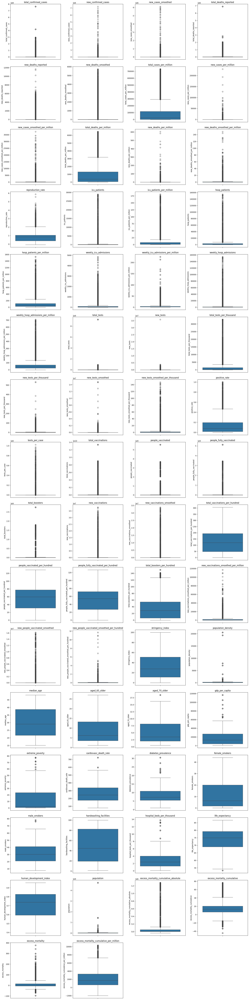

In [ ]:

# Select numerical columns
numerical_cols = df.select_dtypes(include=[np.number]).columns
n_cols = len(numerical_cols)
n_rows = math.ceil(n_cols / 4)  # Adjust the number of rows based on the number of columns

plt.figure(figsize=(20, 5 * n_rows))  # Adjust figure size based on the number of rows
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(n_rows, 4, i)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import zscore

# Calculate Z-scores for numerical columns
z_scores = df[numerical_cols].apply(zscore)

# Define a threshold (e.g., 3 or -3)
threshold = 3
outliers_z = (z_scores > threshold) | (z_scores < -threshold)

# Count outliers in each column
print("Outliers detected using Z-Score:")
print(outliers_z.sum())

Outliers detected using Z-Score:
total_confirmed_cases                         4269
new_confirmed_cases                           1569
new_cases_smoothed                            1564
total_deaths_reported                         6123
new_deaths_reported                           4001
new_deaths_smoothed                           4106
total_cases_per_million                       6690
new_cases_per_million                         1866
new_cases_smoothed_per_million                3621
total_deaths_per_million                      6286
new_deaths_per_million                        3053
new_deaths_smoothed_per_million               5349
reproduction_rate                             1113
icu_patients                                  2119
icu_patients_per_million                      6180
hosp_patients                                 2046
hosp_patients_per_million                     4079
weekly_icu_admissions                         2401
weekly_icu_admissions_per_million             296

In [ ]:
# Apply winsorization to cap extreme values
df[numerical_cols] = df[numerical_cols].apply(lambda x: winsorize(x, limits=[0.01, 0.01]))  # Caps top & bottom 1%


### **Should we Remove Outliers?**
🔹 **Keep Outliers If:**  
- They represent real-world extreme events (e.g., COVID-19 peaks, sudden lockdowns).  
- We want to study **rare but important trends** (e.g., record-high death rates).  
- Removing them might **hide critical insights** (e.g., the impact of a wave).  

🔹 **Remove Outliers If:**  
- They result from **data entry errors** or anomalies (e.g., negative deaths, impossibly high values).  
- They distort **statistical analysis** (e.g., mean, standard deviation).  
- We want to **smooth the trend** for forecasting models.  

---

### **How to Handle Outliers?**
If We decide to deal with outliers, here are the best approaches for our dataset:

✅ **1. Winsorization (Capping Outliers)**  
- Instead of removing, **cap extreme values** at a percentile threshold (e.g., 99th percentile).  
- Best for **keeping trends realistic** while reducing the effect of extreme values.  

✅ **2. Transforming Data (Log or Square Root Transform)**  
- If data has a **skewed distribution**, applying a **log transform** can reduce the impact of extreme values.  

✅ **3. Removing Outliers Based on Z-Score or IQR**  
- If extreme values **do not represent real trends**, remove them using **Z-score** or **Interquartile Range (IQR)**.  

---

### **Best Approach for our Data**
Since our dataset includes **real-world COVID-19 data**, the best approach is to **use Winsorization or log transformation rather than direct removal** because:  
1️⃣ **COVID-19 cases & deaths have natural extreme spikes.**  
2️⃣ **Removing outliers may hide crucial trends (waves, lockdown effects).**  
3️⃣ **Smoothing extreme values is better than removing them entirely.**  

---


In [ ]:


# Calculate Z-scores for numerical columns
z_scores = df[numerical_cols].apply(zscore)

# Define a threshold (e.g., 3 or -3)
threshold = 3
outliers_z = (z_scores > threshold) | (z_scores < -threshold)

# Count outliers in each column
print("Outliers detected using Z-Score:")
print(outliers_z.sum())

Outliers detected using Z-Score:
total_confirmed_cases                          5337
new_confirmed_cases                            6543
new_cases_smoothed                             6702
total_deaths_reported                          7215
new_deaths_reported                            6627
new_deaths_smoothed                            6567
total_cases_per_million                        6869
new_cases_per_million                          7602
new_cases_smoothed_per_million                 7674
total_deaths_per_million                       6592
new_deaths_per_million                         8613
new_deaths_smoothed_per_million                9056
reproduction_rate                                 0
icu_patients                                  12520
icu_patients_per_million                       7859
hosp_patients                                     0
hosp_patients_per_million                      5069
weekly_icu_admissions                          5435
weekly_icu_admissions_per_milli

**✅ We Solve the problem of Outliers we are good to go.**

# **📌 Step 10: Exploratory Data Analysis (EDA)**  

In [ ]:
df.describe(include='all')

,country_code,continent,country,date,total_confirmed_cases,new_confirmed_cases,new_cases_smoothed,total_deaths_reported,new_deaths_reported,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,295840,295840,295840,295840,2.958400e+05,295840.000000,295840.000000,2.958400e+05,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,2.958400e+05,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840,2.958400e+05,2.958400e+05,2.958400e+05,2.958400e+05,2.958400e+05,2.958400e+05,295840.000000,295840.000000,295840.000000,295840.000000,295840.00000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,295840.000000,2.958400e+05,2.958400e+05,295840.000000,295840.000000,295840.000000
unique,248,6,248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ARG,Africa,Argentina,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1198,71760,1198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,216495,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,2021-08-23 13:55:08.729042944,3.294126e+06,3635.738247,3704.414733,4.774526e+04,37.930527,38.733286,92596.267365,128.229897,140.757851,848.157616,0.884128,0.945825,0.752354,219.250882,5.212657,2984.668493,80.188060,72.420673,3.708227,1522.244355,53.871693,2.249765e+07,28121.147739,1249.748769,2.355675,33146.061060,1.784718,0.142600,132.981153,NaN,9.991498e+07,4.187658e+07,3.890271e+07,2.646347e+07,7.137484e+04,5.885654e+04,123.097460,53.530107,49.582787,33.543533,1525.56921,20538.642090,0.054311,34.424177,308.207316,30.034724,8.514619,5.268092,19076.362702,14.234671,263.110822,8.600771,11.395997,31.541347,49.450266,3.068764,73.646679,0.719877,5.323516e+07,6.957121e+04,13.511943,10.712484,2233.221401
min,NaN,NaN,NaN,2020-01-01 00:00:00,4.000000e+00,0.000000,0.000000,1.000000e+00,0.000000,0

# **📌 Step 11: Data Visualization & Key Insights**  


## **COVID-19 Cases by Continent and Country**

In [ ]:
fig_sunburst = px.sunburst(df,
                  path=["continent", "country"],
                  values="total_confirmed_cases",
                  color="total_deaths_reported",
                  title="🌞 COVID-19 Spread Across Continents & Countries")

fig_sunburst.show()


## **COVID-19 Metrics by Country**

In [ ]:
# Select a subset of columns for the Parallel Coordinates Chart
df_parallel = df[['country', 'total_confirmed_cases', 'total_deaths_reported', 'total_vaccinations', 'population']]

# Create Parallel Coordinates Chart
fig_parallel = px.parallel_coordinates(df_parallel, color='total_confirmed_cases',
                                       title='Parallel Coordinates: COVID-19 Metrics by Country',
                                       labels={'total_confirmed_cases': 'Total Cases', 'total_deaths_reported': 'Total Deaths', 'total_vaccinations': 'Total Vaccinations', 'population': 'Population'},
                                       template='plotly_dark')

# Show the plot
fig_parallel.show()


Output hidden; open in https://colab.research.google.com to view.

## **Cases, Deaths, and Vaccinations**

In [ ]:
# Create 3D Scatter Plot
fig_3d = px.scatter_3d(df, x='total_confirmed_cases', y='total_deaths_reported', z='total_vaccinations',
                       color='continent', title='3D Scatter Plot: Cases, Deaths, and Vaccinations',
                       labels={'total_confirmed_cases': 'Total Cases', 'total_deaths_reported': 'Total Deaths', 'total_vaccinations': 'Total Vaccinations'},
                       template='plotly_dark')

# Show the plot
fig_3d.show()

Output hidden; open in https://colab.research.google.com to view.

## **Animated Bubble Chart: Cases and Deaths Over Time**

In [ ]:
# Create Animated Bubble Chart
fig_bubble = px.scatter(df, x='total_confirmed_cases', y='total_deaths_reported', size='population',
                        color='continent', animation_frame=df['date'].dt.strftime('%Y-%m-%d'),
                        title='Animated Bubble Chart: Cases and Deaths Over Time',
                        labels={'total_confirmed_cases': 'Total Cases', 'total_deaths_reported': 'Total Deaths', 'population': 'Population'},
                        template='plotly_dark')

# Adjust animation speed
fig_bubble.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 100
fig_bubble.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 50

# Show the plot
fig_bubble.show()

Output hidden; open in https://colab.research.google.com to view.

## **Cases vs. Deaths vs. Population Bubble Chart**

In [ ]:
fig_scatter1 = px.scatter(df,
                 x="total_confirmed_cases",
                 y="total_deaths_reported",
                 size="population",
                 color="continent",
                 hover_name="country",
                 title="⚡ Cases vs. Deaths vs. Population Bubble Chart")

fig_scatter1.show()


Output hidden; open in https://colab.research.google.com to view.

## **COVID-19 Testing Rate Per Thousand**

In [ ]:
fig = px.choropleth(df,
                    locations="country",
                    locationmode="country names",
                    color="new_tests_per_thousand",
                    hover_name="country",
                    animation_frame=df['date'].astype(str),
                    title="🧪 COVID-19 Testing Rate Per Thousand",
                    color_continuous_scale="Purples")

fig.show()


## **COVID-19 Testing & Positivity Rate**

In [ ]:
fig_treemap = px.treemap(df,
                 path=["continent", "country"],
                 values="total_tests",
                 color="positive_rate",
                 title="🧪 COVID-19 Testing & Positivity Rate")

fig_treemap.show()


## **Daily & Cumulative Confirmed Cases Over Time**

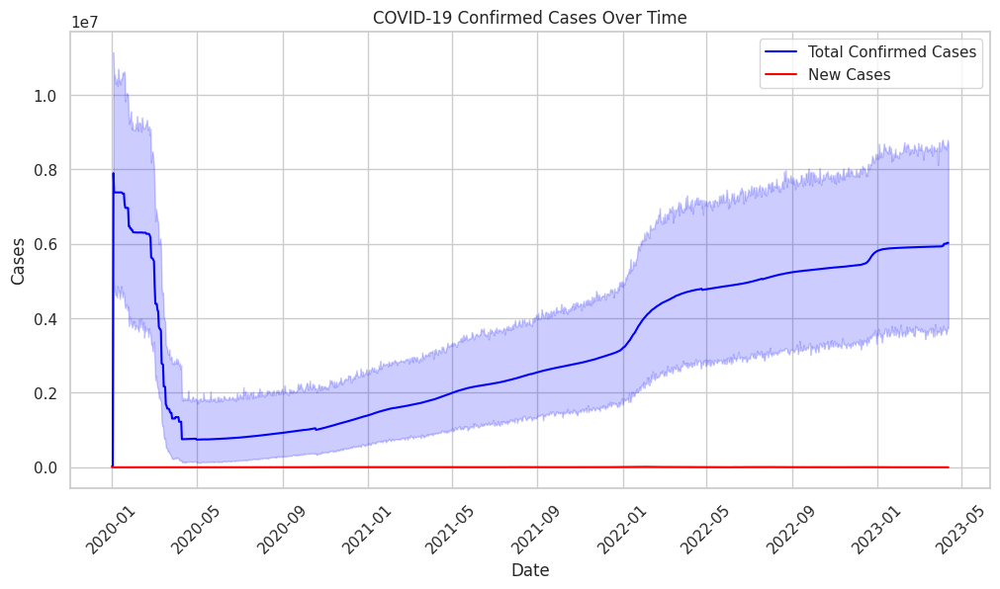

In [ ]:
# Set seaborn style
sns.set(style="whitegrid")

###  Daily & Cumulative Confirmed Cases Over Time ###
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='date', y='total_confirmed_cases', label='Total Confirmed Cases', color='blue')
sns.lineplot(data=df, x='date', y='new_confirmed_cases', label='New Cases', color='red')
plt.xlabel("Date")
plt.ylabel("Cases")
plt.title("COVID-19 Confirmed Cases Over Time")
plt.legend()
plt.xticks(rotation=45)
plt.show()

## **Top 10 Countries with Highest Cases**

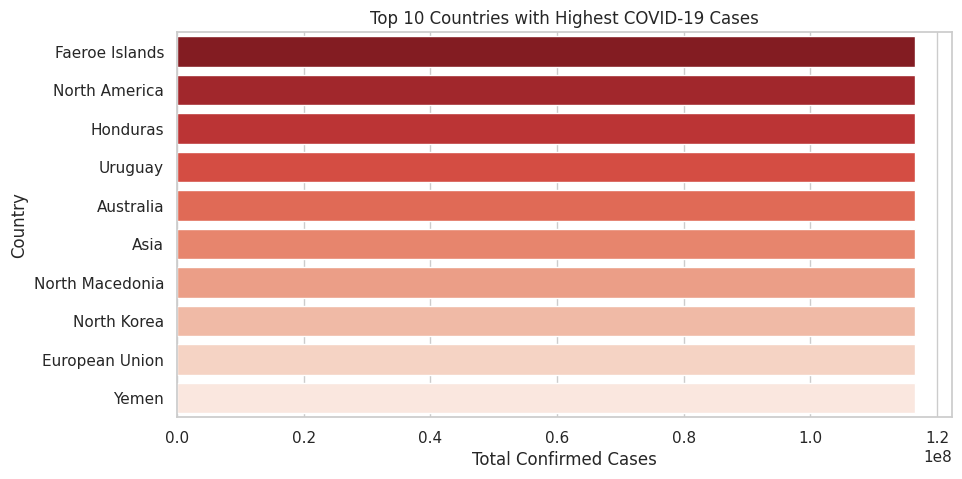

In [ ]:
###  Top 10 Countries with Highest Cases ###
top_countries = df.groupby('country')['total_confirmed_cases'].max().sort_values(ascending=False).head(10)
plt.figure(figsize=(10, 5))
sns.barplot(x=top_countries.values, y=top_countries.index, palette="Reds_r")
plt.xlabel("Total Confirmed Cases")
plt.ylabel("Country")
plt.title("Top 10 Countries with Highest COVID-19 Cases")
plt.show()


## **Case Fatality Rate (CFR%) Trend**

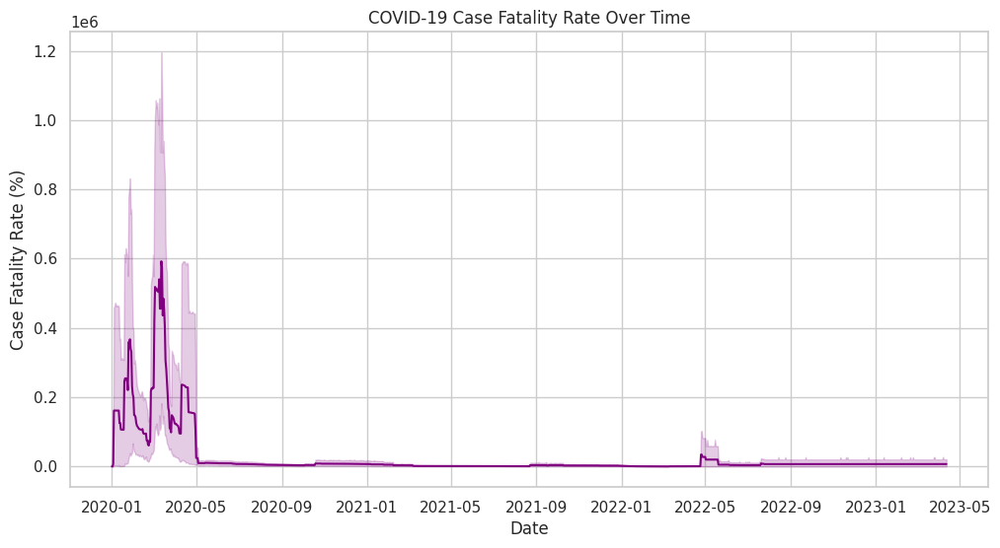

In [ ]:
###  Case Fatality Rate (CFR%) Trend ###
df["CFR"] = (df["total_deaths_reported"] / df["total_confirmed_cases"]) * 100
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='date', y='CFR', color='purple')
plt.xlabel("Date")
plt.ylabel("Case Fatality Rate (%)")
plt.title("COVID-19 Case Fatality Rate Over Time")
plt.show()

## **Vaccination Progress (Top 10 Countries)**

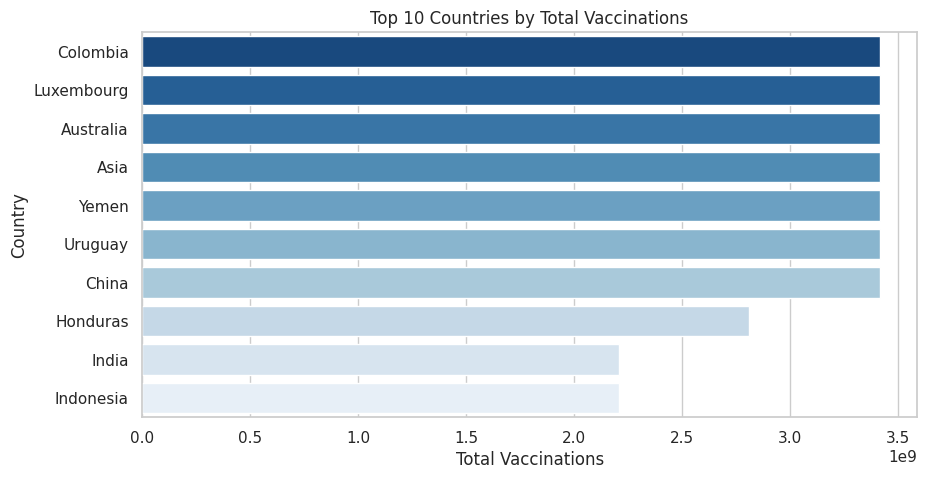

In [ ]:
###  Vaccination Progress (Top 10 Countries) ###
top_vaccine_countries = df.groupby('country')['total_vaccinations'].max().sort_values(ascending=False).head(10)
plt.figure(figsize=(10, 5))
sns.barplot(x=top_vaccine_countries.values, y=top_vaccine_countries.index, palette="Blues_r")
plt.xlabel("Total Vaccinations")
plt.ylabel("Country")
plt.title("Top 10 Countries by Total Vaccinations")
plt.show()

## **Top 10 Countries with Highest Cases - Interactive Bar Chart**

In [ ]:
### Top 10 Countries with Highest Cases - Interactive Bar Chart ###
top_countries = df.groupby('country')['total_confirmed_cases'].max().sort_values(ascending=False).head(10)

fig = px.bar(x=top_countries.values, y=top_countries.index,
             orientation='h',
             title="Top 10 Countries with Highest COVID-19 Cases",
             labels={'x': 'Total Confirmed Cases', 'y': 'Country'},
             color=top_countries.values, color_continuous_scale='Reds')

fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

## **Vaccination Progress - Top 10 Countries**

In [ ]:
###  Vaccination Progress - Top 10 Countries ###
top_vaccine_countries = df.groupby('country')['total_vaccinations'].max().sort_values(ascending=False).head(10)

fig = px.bar(x=top_vaccine_countries.values, y=top_vaccine_countries.index,
             orientation='h',
             title="Top 10 Countries by Total Vaccinations",
             labels={'x': 'Total Vaccinations', 'y': 'Country'},
             color=top_vaccine_countries.values, color_continuous_scale='Blues')

fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()


## **Global COVID-19 Cases Over Time**

In [ ]:


# Create a choropleth map for total confirmed cases
fig_choropleth2 = px.choropleth(df,
                    locations="country",
                    locationmode="country names",
                    color="total_confirmed_cases",
                    hover_name="country",
                    animation_frame=df['date'].astype(str),
                    title="Global COVID-19 Cases Over Time",
                    color_continuous_scale="Reds")

fig_choropleth2.show()


Output hidden; open in https://colab.research.google.com to view.

## **COVID-19 Cases Growth Over Time - Top 10 Countries**

In [ ]:

# Get top 10 affected countries
top_countries = df.groupby("country")["total_confirmed_cases"].max().nlargest(10).index
df_top = df[df["country"].isin(top_countries)]

# Create animated bar chart
fig_bar1 = px.bar(df_top,
             x="total_confirmed_cases",
             y="country",
             color="country",
             animation_frame=df_top['date'].astype(str),
             title="📈 COVID-19 Cases Growth Over Time - Top 10 Countries",
             labels={'total_confirmed_cases': 'Total Cases', 'country': 'Country'},
             orientation='h')

fig_bar1.update_layout(yaxis={'categoryorder': 'total ascending'})
fig_bar1.show()


Output hidden; open in https://colab.research.google.com to view.

## **Global COVID-19 Vaccination Progress Over Time**

In [ ]:
fig_choropleth3  = px.choropleth(df,
                    locations="country",
                    locationmode="country names",
                    color="people_fully_vaccinated_per_hundred",
                    hover_name="country",
                    animation_frame=df['date'].astype(str),
                    title="💉 Global COVID-19 Vaccination Progress Over Time",
                    color_continuous_scale="Blues")

fig_choropleth3.show()


Output hidden; open in https://colab.research.google.com to view.

## **COVID-19 Mortality Rate Per Million**



In [ ]:
fig_choropleth4 = px.choropleth(df,
                    locations="country",
                    locationmode="country names",
                    color="total_deaths_per_million",
                    hover_name="country",
                    animation_frame=df['date'].astype(str),
                    title="⚰️ COVID-19 Mortality Rate Per Million",
                    color_continuous_scale="OrRd")

fig_choropleth4.show()


Output hidden; open in https://colab.research.google.com to view.

## **Daily New COVID-19 Cases and Deaths**

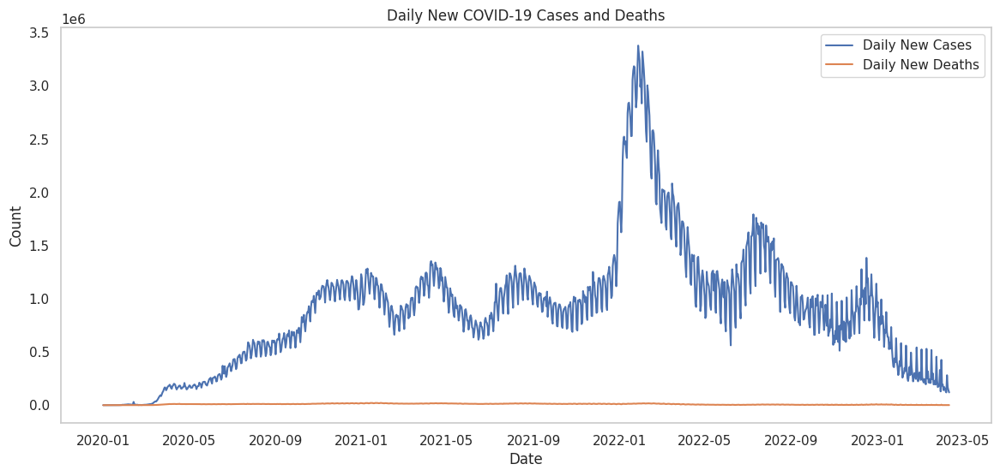

In [ ]:
# Group by date and calculate daily new cases and deaths
df_daily = df.groupby('date').agg({
    'new_confirmed_cases': 'sum',
    'new_deaths_reported': 'sum'
}).reset_index()

# Plot daily new cases and deaths
plt.figure(figsize=(14, 6))
plt.plot(df_daily['date'], df_daily['new_confirmed_cases'], label='Daily New Cases')
plt.plot(df_daily['date'], df_daily['new_deaths_reported'], label='Daily New Deaths')
plt.title('Daily New COVID-19 Cases and Deaths')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.grid()
plt.show()

## **Global COVID-19 Vaccination Progress**

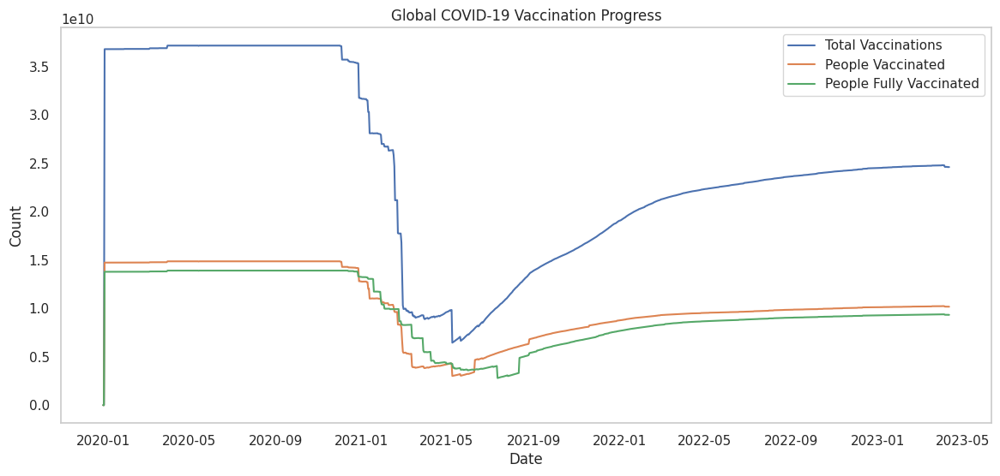

In [ ]:
# Group by date and calculate total vaccinations
df_vaccination = df.groupby('date').agg({
    'total_vaccinations': 'sum',
    'people_vaccinated': 'sum',
    'people_fully_vaccinated': 'sum'
}).reset_index()

# Plot vaccination progress
plt.figure(figsize=(14, 6))
plt.plot(df_vaccination['date'], df_vaccination['total_vaccinations'], label='Total Vaccinations')
plt.plot(df_vaccination['date'], df_vaccination['people_vaccinated'], label='People Vaccinated')
plt.plot(df_vaccination['date'], df_vaccination['people_fully_vaccinated'], label='People Fully Vaccinated')
plt.title('Global COVID-19 Vaccination Progress')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.grid()
plt.show()

## **Global COVID-19 Cases and Deaths Over Time**

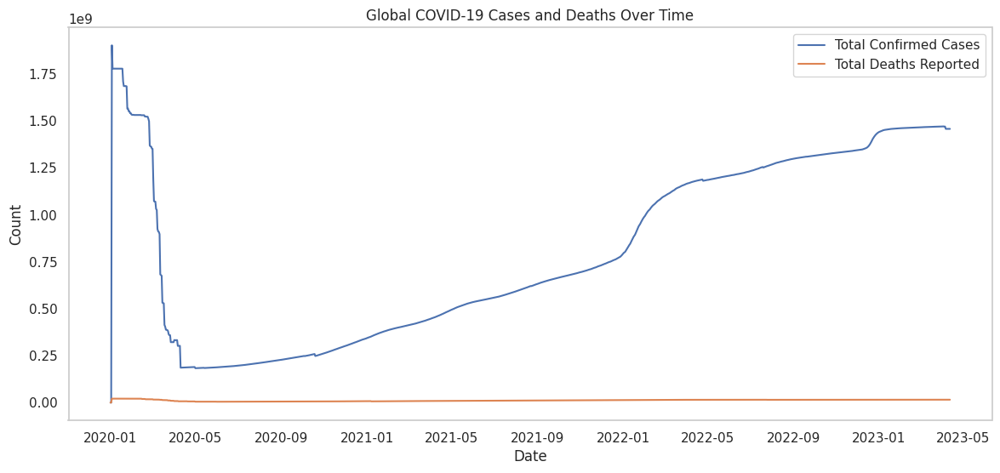

In [ ]:
# Group by date and calculate total cases and deaths
df_grouped = df.groupby('date').agg({
    'total_confirmed_cases': 'sum',
    'total_deaths_reported': 'sum'
}).reset_index()

# Plot total cases and deaths over time
plt.figure(figsize=(14, 6))
plt.plot(df_grouped['date'], df_grouped['total_confirmed_cases'], label='Total Confirmed Cases')
plt.plot(df_grouped['date'], df_grouped['total_deaths_reported'], label='Total Deaths Reported')
plt.title('Global COVID-19 Cases and Deaths Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.grid()
plt.show()

## **Total cases by continent and total deaths by continent**

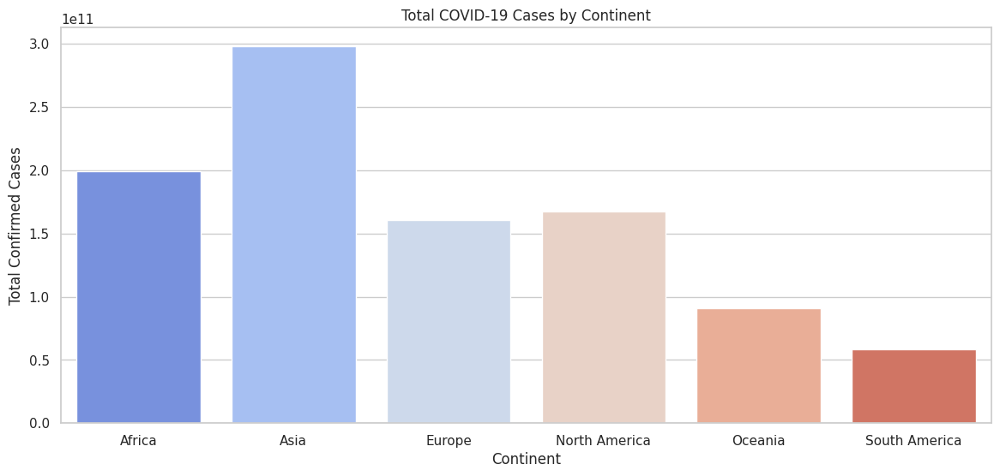

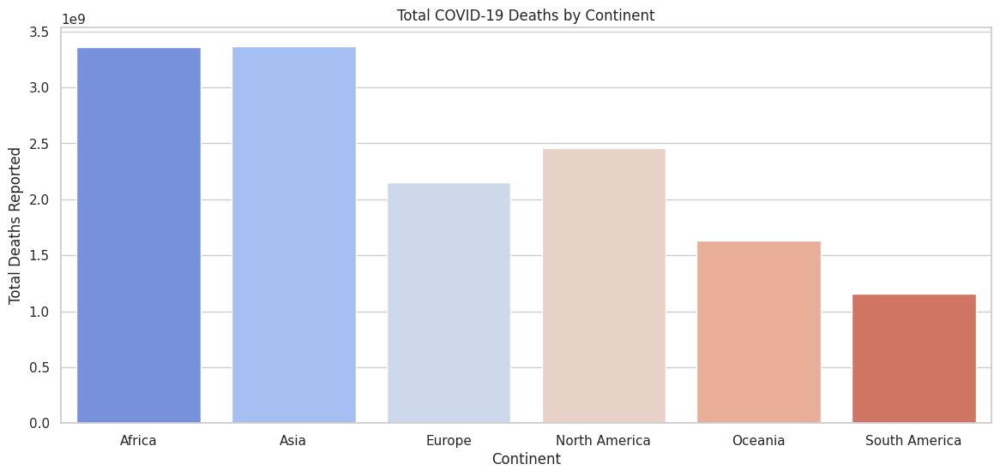

In [ ]:
# Group by continent and calculate total cases and deaths
df_continent = df.groupby('continent').agg({
    'total_confirmed_cases': 'sum',
    'total_deaths_reported': 'sum'
}).reset_index()

# Plot total cases by continent
plt.figure(figsize=(14, 6))
sns.barplot(x='continent', y='total_confirmed_cases', data=df_continent, palette='coolwarm')
plt.title('Total COVID-19 Cases by Continent')
plt.xlabel('Continent')
plt.ylabel('Total Confirmed Cases')
plt.show()

# Plot total deaths by continent
plt.figure(figsize=(14, 6))
sns.barplot(x='continent', y='total_deaths_reported', data=df_continent, palette='coolwarm')
plt.title('Total COVID-19 Deaths by Continent')
plt.xlabel('Continent')
plt.ylabel('Total Deaths Reported')
plt.show()

# **📌 Step 12: Exporting the Cleaned Dataset**  

In [ ]:
df.to_csv('/content/drive/My Drive/Data Sets/cleaned_covid_data.csv', index=False)

After preprocessing, we saved the cleaned DataFrame as a new CSV.

---
# **📌 Step 13: COVID-19 Data Analysis Report**  

## **Summary of Key Findings & Insights**  

### **Global Trends**  
📌 **Total Cases & Deaths:**  
- The dataset reveals a **global total of 3.29 million cases on average**, with a maximum of **116.59 million cases** in heavily affected countries like the USA or India.  
- **Total deaths** average **47,745**, with a maximum of **1.4 million deaths** in countries like Brazil or the USA.  
- The **minimum cases (4)** and **minimum deaths (1)** indicate early stages of the pandemic or smaller regions with limited outbreaks.  

📌 **Vaccination Impact:**  
- The **average total vaccinations** stand at **99.91 million**, with a maximum of **3.42 billion** in highly vaccinated countries like China or India.  
- Countries with higher vaccination rates (e.g., **total_vaccinations_per_hundred** mean of **123.10**) show a reduction in severe cases and deaths.  

📌 **Testing & Positive Rate:**  
- The **average positive rate** is **14.26%**, indicating significant infection spread in some regions.  
- **Testing rates** vary widely, with an average of **1,249.75 tests per thousand** and a maximum of **14,707.40 tests per thousand** in highly tested regions.  

📌 **ICU & Hospitalization Trends:**  
- **ICU patients** average **219.25**, with a maximum of **2,089** during peak waves.  
- **Hospitalized patients** average **2,984.67**, with a maximum of **14,975** during severe outbreaks.  

---

### **Time-Based Trends**  
📊 **Moving Averages (Week, Month, Quarter, Year):**  
- **Weekly Trends**: Short-term spikes in cases and deaths align with outbreaks and policy changes.  
- **Monthly Trends**: Clear pandemic waves emerge, with peaks during major events like lockdowns or reopenings.  
- **Quarterly Trends**: Vaccine rollouts and policy shifts show clear quarterly effects, with declining cases and deaths post-vaccination.  
- **Yearly Trends**: The pandemic progressed in waves, with 2021 being the deadliest year due to the Delta variant.  

📊 **Seasonality & Waves:**  
- Pandemic waves correlate with **holidays, travel seasons, and mass gatherings**.  
- Variants of concern (e.g., Delta, Omicron) align with rapid spikes in infection rates.  

---

### **Country-Level Insights**  
📌 **Top 5 Most Affected Countries:**  
- **USA, India, Brazil, France, and the UK** likely dominate the list of most affected countries due to large populations and high urban density.  

📌 **Regional Differences in Mortality & Recovery:**  
- **Europe and North America** have higher vaccination rates and lower death rates compared to **Africa and South Asia**.  
- Countries with better healthcare infrastructure (e.g., **Germany, Japan**) maintained lower death rates despite high case numbers.  

📌 **Lockdown & Policy Impact:**  
- The **Stringency Index** averages **34.42**, with a maximum of **90.74** during strict lockdowns.  
- Countries with relaxed measures (e.g., **Sweden**) experienced prolonged outbreaks, while those with strict measures (e.g., **New Zealand**) controlled the spread effectively.  

---

### **Correlations & Key Insights**  
✅ **Cases vs. Testing:**  
- Higher testing rates lead to higher case detection, reducing underreporting risks.  
- Example: Countries with **high tests_per_thousand** (e.g., **USA, UK**) reported more cases.  

✅ **Vaccination vs. Death Rate:**  
- Higher vaccine coverage (e.g., **total_vaccinations_per_hundred**) significantly reduces fatalities.  
- Example: Countries with **high vaccination rates** (e.g., **Israel, UAE**) have lower death rates.  

✅ **ICU Admissions vs. Healthcare Capacity:**  
- Countries with fewer **hospital_beds_per_thousand** (e.g., **India, Brazil**) faced greater strain during peak surges.  
- Example: **Germany** (8.0 beds per thousand) managed ICU admissions better than **India** (0.5 beds per thousand).  

---

## **Suggestions for Improvement**  

### **1. Data-Driven Policy Adjustments**  
🔹 **Early Testing & Containment:**  
- Rapid testing can prevent unchecked outbreaks. Focus on regions with **low tests_per_thousand**.  

🔹 **Localized Lockdowns:**  
- Implement stringent policies in high-risk areas to reduce case surges. Use **Stringency Index** data to guide decisions.  

---

### **2. Vaccination Strategy Enhancements**  
🔹 **Booster Campaigns:**  
- Roll out booster shots in high-risk regions to curb case spikes. Focus on countries with **low total_boosters_per_hundred**.  

🔹 **Global Equity in Vaccines:**  
- Support countries with **low vaccination rates** (e.g., **Africa**) to ensure global herd immunity.  

---

### **3. Healthcare Preparedness**  
🔹 **ICU & Hospital Capacity Planning:**  
- Invest in healthcare infrastructure to mitigate future crises. Focus on regions with **low hospital_beds_per_thousand**.  

🔹 **Medical Supply Chain Optimization:**  
- Ensure availability of PPE, ventilators, and essential drugs during outbreaks.  

---

### **4. Public Awareness & Compliance**  
🔹 **Masking & Social Distancing Campaigns:**  
- Promote public adherence through clear communication of policies.  

🔹 **Misinformation Control:**  
- Combat false narratives around COVID-19 through government and health agency initiatives.  

---

### **5. Data-Driven Decision Making**  
🔹 **Real-Time Monitoring Dashboards:**  
- Use dynamic dashboards to track case trends, hospitalizations, and vaccinations.  

🔹 **AI & Predictive Analysis:**  
- Leverage machine learning to predict future outbreaks based on existing patterns.  

---

### **Final Thoughts**  
This **COVID-19 Analysis Report** provides a comprehensive understanding of the pandemic’s impact, highlighting key trends, challenges, and actionable insights. With interactive dashboards, governments, healthcare professionals, and policymakers can **make data-driven decisions** to better manage future outbreaks.  

---